In [ ]:
!pip install tensorflow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow
import datetime
import glob
from termcolor import colored

In [ ]:
# To ensure GPU is enabled on Colab

# To ensure GPU is enabled on Colab

# Check if GPU is available without raising an error
import tensorflow as tf
if tf.test.gpu_device_name():
  print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
  print("Please ensure that you have enabled GPU acceleration in your Colab runtime settings.")

Please ensure that you have enabled GPU acceleration in your Colab runtime settings.


In [ ]:
from warnings import filterwarnings
filterwarnings("ignore")

from sklearn import set_config
set_config(print_changed_only = False)
directory = "/content/drive/MyDrive/breast cancer cell"

In [ ]:
print(tensorflow.config.list_physical_devices("GPU"))

print("________________________________________________")

print(tensorflow.test.is_gpu_available(cuda_only = False, min_cuda_compute_capability = None))

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


[]
________________________________________________
False


In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Define the source and destination folder pairs
folders = [
    {
        "source": '/content/drive/MyDrive/breast cancer cell/validation folder/img/',  # Replace with the first source folder path
        "destination": '/content/drive/MyDrive/breast cancer cell/validation folder/masks/'  # Replace with the first destination folder path
    },
    {
        "source": '/content/drive/MyDrive/breast cancer cell/train folder/img/',  # Replace with the second source folder path
        "destination": '/content/drive/MyDrive/breast cancer cell/train folder/masks/'  # Replace with the second destination folder path
    },
    {
        "source": '/content/drive/MyDrive/breast cancer cell/test folder/img/',  # Replace with the third source folder path
        "destination": '/content/drive/MyDrive/breast cancer cell/test folder/masks/'  # Replace with the third destination folder path
    }
]

# Iterate over each folder pair
for folder in folders:
    source_folder = folder["source"]
    destination_folder = folder["destination"]

    # Create the destination folder if it does not exist
    os.makedirs(destination_folder, exist_ok=True)

    # Loop through all files in the source folder
    for filename in os.listdir(source_folder):
        # Construct full file path
        file_path = os.path.join(source_folder, filename)

        # Check if the file is an image (optional: filter specific formats)
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')):
            # Load the image in grayscale
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

            # Check if the image is loaded correctly
            if image is None:
                print(f"Error: Unable to load image {filename} from {source_folder}. Skipping.")
                continue

            # Apply inverse binary threshold to create a binary mask
            _, binary_mask = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)

            # Create the ground truth mask (same as binary mask in this example)
            ground_truth_mask = binary_mask.copy()

            # Save the ground truth mask to the destination folder
            mask_save_path = os.path.join(destination_folder, filename)  # Save with the same filename
            cv2.imwrite(mask_save_path, ground_truth_mask)

            print(f"Processed and saved ground truth mask for {filename} in {destination_folder}")

            # Optional: Display the original image and the mask
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 3, 1)
            plt.imshow(image, cmap='gray')
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(binary_mask, cmap='gray')
            plt.title('Binary Mask')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(ground_truth_mask, cmap='gray')
            plt.title('Ground Truth Mask')
            plt.axis('off')

            plt.tight_layout()
            plt.show()

print("All images from all folders processed and ground truth masks saved.")


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import MeanIoU
from skimage.io import imread, imshow
from skimage.transform import resize
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [ ]:
train_img_path = '../content/drive/MyDrive/breast cancer cell/train folder/img/'
train_mask_path = '../content/drive/MyDrive/breast cancer cell/train folder/masks/'
val_img_path = '../content/drive/MyDrive/breast cancer cell/validation folder/img'
val_mask_path = '../content/drive/MyDrive/breast cancer cell/validation folder/masks'


In [ ]:
# Load images and masks
train_images = sorted([os.path.join(train_img_path, f) for f in os.listdir(train_img_path) if f.endswith('.png')])
train_masks = sorted([os.path.join(train_mask_path, f) for f in os.listdir(train_mask_path) if f.endswith('.png')])
val_images = sorted([os.path.join(val_img_path, f) for f in os.listdir(val_img_path) if f.endswith('.png')])
val_masks = sorted([os.path.join(val_mask_path, f) for f in os.listdir(val_mask_path) if f.endswith('.png')])


In [ ]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
IMG_CHANNELS = 1

In [ ]:
# Load and resize images
def load_and_resize(images, masks):
    X = np.zeros((len(images), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
    y = np.zeros((len(masks), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool_)
    for n, img_path in enumerate(images):
        img = imread(img_path, as_gray=True)
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        X[n] = np.expand_dims(img, axis=-1)

    for n, mask_path in enumerate(masks):
        mask = imread(mask_path, as_gray=True)
        mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        y[n] = np.expand_dims(mask, axis=-1)

    return X, y

In [ ]:
# Load the training and validation data
X_train, y_train = load_and_resize(train_images, train_masks)
X_val, y_val = load_and_resize(val_images, val_masks)


In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation parameters
data_gen_args = dict(rotation_range=20,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     shear_range=0.1,
                     zoom_range=0.2,
                     horizontal_flip=True,
                     fill_mode='nearest')

# ImageDataGenerators for augmentation
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)



In [ ]:
# Combine generators
seed = 42
train_image_generator = image_datagen.flow(X_train, batch_size=16, seed=seed)
train_mask_generator = mask_datagen.flow(y_train, batch_size=16, seed=seed)
train_generator = zip(train_image_generator, train_mask_generator)


In [ ]:
# Ensure the data generators are correctly configured for validation
validation_image_generator = image_datagen.flow(X_val, batch_size=16, seed=42)
validation_mask_generator = mask_datagen.flow(y_val, batch_size=16, seed=42)

In [ ]:
import tensorflow as tf

# Define U-Net Model with Regularization Layers and Reduced Complexity
# Define U-Net Model with Regularization Layers, Reduced Complexity, and Adjustable Dropout Rate
def unet_model(input_size=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout_rate=0.7):
    inputs = tf.keras.layers.Input(input_size)

    # Encoder (Reduced filter sizes)
    c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = tf.keras.layers.BatchNormalization()(c1)
    c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c1)
    c1 = tf.keras.layers.BatchNormalization()(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)
    p1 = tf.keras.layers.Dropout(dropout_rate)(p1)

    c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = tf.keras.layers.BatchNormalization()(c2)
    c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c2)
    c2 = tf.keras.layers.BatchNormalization()(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
    p2 = tf.keras.layers.Dropout(dropout_rate)(p2)

    c3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    c3 = tf.keras.layers.BatchNormalization()(c3)
    c3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c3)
    c3 = tf.keras.layers.BatchNormalization()(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
    p3 = tf.keras.layers.Dropout(dropout_rate)(p3)

    # Bottleneck
    c4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    c4 = tf.keras.layers.BatchNormalization()(c4)
    c4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c4)
    c4 = tf.keras.layers.BatchNormalization()(c4)
    c4 = tf.keras.layers.Dropout(dropout_rate)(c4)

    # Decoder
    u1 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = tf.keras.layers.concatenate([u1, c3])
    c5 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u1)
    c5 = tf.keras.layers.BatchNormalization()(c5)
    c5 = tf.keras.layers.Dropout(dropout_rate)(c5)

    u2 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u2 = tf.keras.layers.concatenate([u2, c2])
    c6 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u2)
    c6 = tf.keras.layers.BatchNormalization()(c6)
    c6 = tf.keras.layers.Dropout(dropout_rate)(c6)

    u3 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
    u3 = tf.keras.layers.concatenate([u3, c1])
    c7 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u3)
    c7 = tf.keras.layers.BatchNormalization()(c7)
    c7 = tf.keras.layers.Dropout(dropout_rate)(c7)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)

    model = tf.keras.models.Model(inputs=[inputs], outputs=[outputs])
    return model

# Instantiate the model
model = unet_model()
model.summary()



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 32)   │            320 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 128, 128, 32)   │            128 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 32)   │          9,248 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 128, 128, 32)   │            128 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 32)     │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 64, 64, 32)     │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 64)     │         18,496 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 64)     │         36,928 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 64, 64, 64)     │            256 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 64)     │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 32, 32, 64)     │              0 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 128)    │         73,856 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 32, 32, 128)    │            512 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 32, 32, 128)    │        147,584 │ batch_normalization_4… │
├──────────────────────

 Total params: 1,736,001 (6.62 MB)

 Trainable params: 1,733,633 (6.61 MB)

 Non-trainable params: 2,368 (9.25 KB)

In [ ]:
from tensorflow.keras.metrics import BinaryAccuracy, Precision, Recall

# Instantiate Precision and Recall outside the function
precision = Precision()
recall = Recall()

def f1_score(y_true, y_pred):
    # Adjust threshold for metric calculation
    y_pred = tf.cast(y_pred > 0.3, tf.float32)  # Adjust threshold if needed
    # Use the pre-instantiated objects
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * (p * r) / (p + r + tf.keras.backend.epsilon())

In [ ]:
# Compile the model
model = unet_model()
model.compile(optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
              loss='binary_crossentropy',
              metrics=[MeanIoU(num_classes=2), 'accuracy', BinaryAccuracy(), f1_score])



In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import datetime
# Callbacks
checkpoint = ModelCheckpoint('unet_model.keras', monitor='loss', save_best_only=True)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-6)



In [ ]:
# Combine generators using a custom generator function
def train_generator_fn():
    seed = 42
    train_image_generator = image_datagen.flow(X_train, batch_size=16, seed=seed)
    train_mask_generator = mask_datagen.flow(y_train, batch_size=16, seed=seed)
    for img, mask in zip(train_image_generator, train_mask_generator):
        yield img, mask

# Train the model without TensorBoard callback
history = model.fit(train_generator_fn(),
                    steps_per_epoch=len(X_train) // 16,
                    validation_data=(X_val, y_val),
                    epochs=50,
                    callbacks=[checkpoint, early_stopping, reduce_lr])

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.7353 - binary_accuracy: 0.7353 - f1_score: 0.4186 - loss: 1.1730 - mean_io_u_1: 0.4146 - val_accuracy: 0.6823 - val_binary_accuracy: 0.6823 - val_f1_score: 0.4437 - val_loss: 1.1401 - val_mean_io_u_1: 0.3411 - learning_rate: 0.0010
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - accuracy: 0.7714 - binary_accuracy: 0.7714 - f1_score: 0.4194 - loss: 1.1391 - mean_io_u_1: 0.4265 - val_accuracy: 0.6823 - val_binary_accuracy: 0.6823 - val_f1_score: 0.4324 - val_loss: 1.1087 - val_mean_io_u_1: 0.3411 - learning_rate: 0.0010
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.7631 - binary_accuracy: 0.7631 - f1_score: 0.4207 - loss: 1.1067 - mean_io_u_1: 0.4251 - val_accuracy: 0.6823 - val_binary_accuracy: 0.6823 - val_f1_score: 0.4291 - val_loss: 1.0788 - val_mean_io_u_1: 0.3411 - learning_rate: 0.0010
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - accuracy: 0.7459 - binary_accuracy: 0.7459 - f1_score: 0.4254 - loss: 

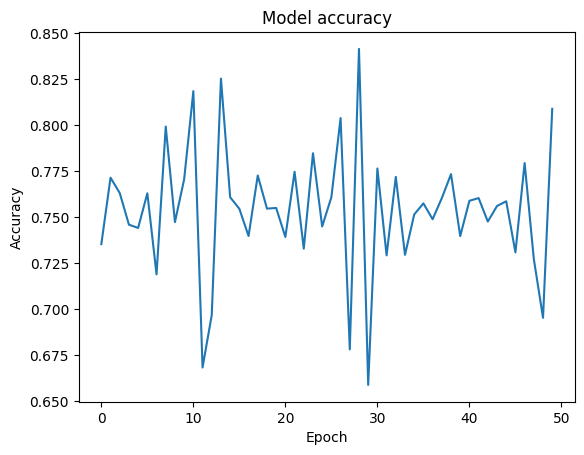

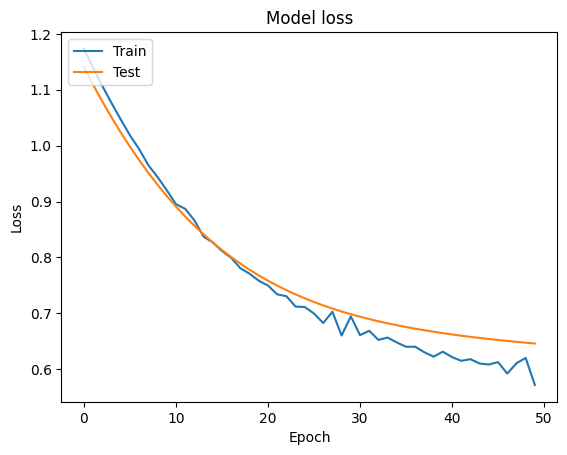

In [ ]:
plt.plot(history.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Test'], loc='upper left')
plt.show()

In [ ]:
# Get the final training accuracy
final_training_accuracy = history.history['accuracy'][-1]
print(f"Final Training Accuracy: {final_training_accuracy:.4f}")

# Get the final validation accuracy, if available
if 'val_accuracy' in history.history:
    final_validation_accuracy = history.history['val_accuracy'][-1]
    print(f"Final Validation Accuracy: {final_validation_accuracy:.4f}")


Final Training Accuracy: 0.7459
Final Validation Accuracy: 0.6823


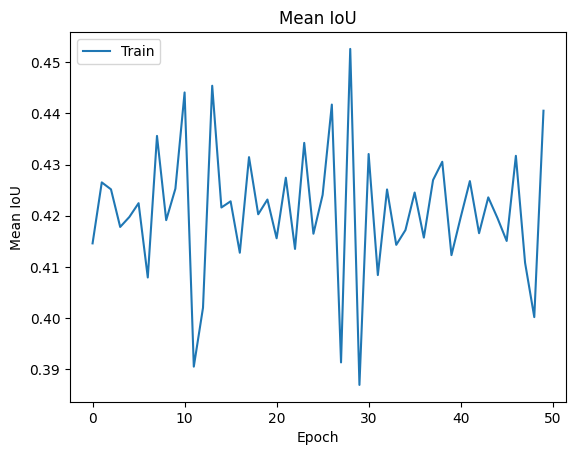

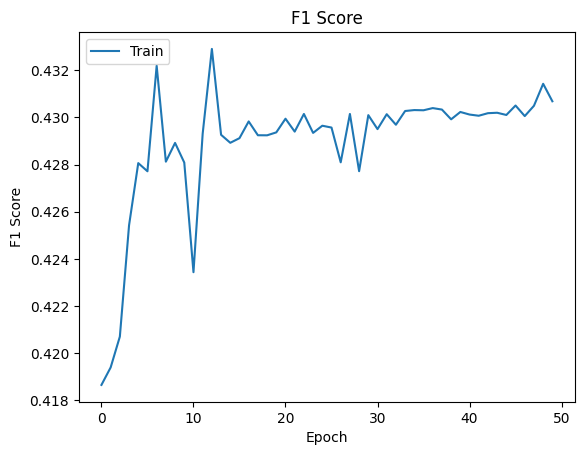

In [ ]:
# Plot MeanIoU if tracked in history
if 'mean_io_u' in history.history:  # Replace 'mean_io_u' with the exact key in your history object
    plt.plot(history.history['mean_io_u'])
    plt.title('Mean IoU')
    plt.ylabel('Mean IoU')
    plt.xlabel('Epoch')
    plt.legend(['Train'], loc='upper left')
    plt.show()

# Plot F1 Score if tracked in history
if 'f1_score' in history.history:  # Replace 'f1_score' with the exact key in your history object
    plt.plot(history.history['f1_score'])
    plt.title('F1 Score')
    plt.ylabel('F1 Score')
    plt.xlabel('Epoch')
    plt.legend(['Train'], loc='upper left')
    plt.show()


In [ ]:
# Get the final training Mean IoU, if tracked
if 'mean_io_u' in history.history:  # Replace 'mean_io_u' with the correct key
    final_training_mean_iou = history.history['mean_io_u'][-1]
    print(f"Final Training Mean IoU: {final_training_mean_iou:.4f}")


# Get the final training F1 Score, if tracked
if 'f1_score' in history.history:  # Replace 'f1_score' with the correct key
    final_training_f1_score = history.history['f1_score'][-1]
    print(f"Final Training F1 Score: {final_training_f1_score:.4f}")




Final Training Mean IoU: 0.4405
Final Training F1 Score: 0.4307


CANNY

Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/09_4.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/09_5.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/09_6.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/10_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/10_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/10_3.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/10_4.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/11_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/11_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/test folder/canny/11_3.png


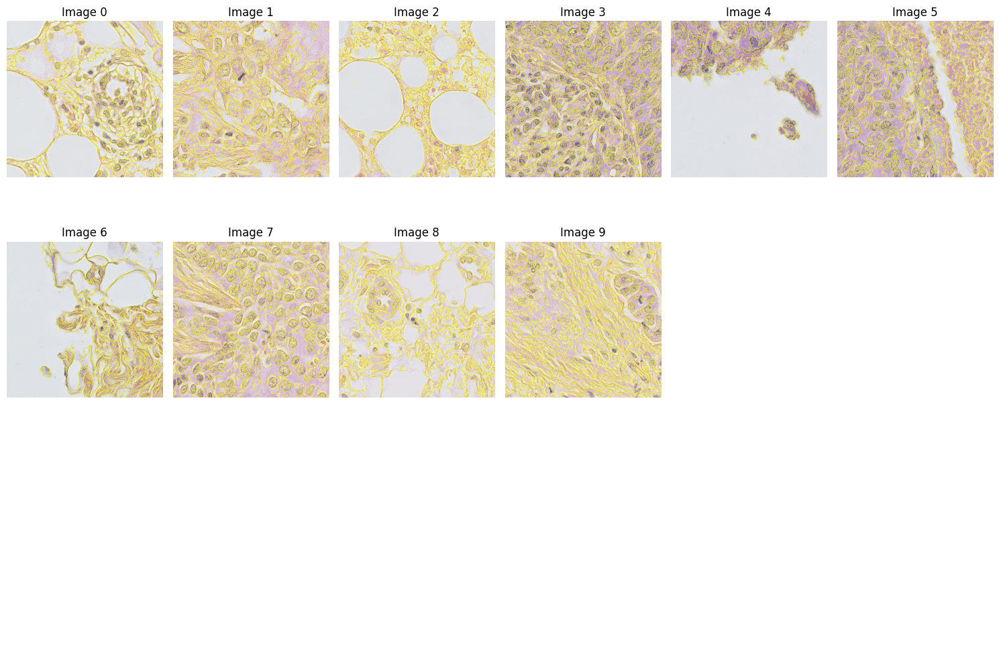

In [ ]:
import os
import numpy as np
from skimage import io, color, feature
import matplotlib.pyplot as plt

# Define directories
input_dir = '/content/drive/MyDrive/breast cancer cell/test folder/img/'
output_dir = '/content/drive/MyDrive/breast cancer cell/test folder/canny/'  # Updated output directory

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# List of filenames (or dynamically list them if not known in advance)
filenames = [f for f in os.listdir(input_dir) if f.endswith('.png')]
filenames.sort()  # Optional, sort filenames

# Process each image
for filename in filenames:
    img_path = os.path.join(input_dir, filename)
    output_path = os.path.join(output_dir, filename)

    if not os.path.exists(img_path):
        print(f"File does not exist: {img_path}")
        continue

    # Read the image
    A = io.imread(img_path)

    # Check if image has alpha channel and remove it
    if A.shape[-1] == 4:
        A = A[:,:,:3]  # Keep only first 3 channels (RGB)

    # Convert to grayscale and detect edges using Canny
    gray_img = color.rgb2gray(A)
    E = feature.canny(gray_img)

    # Create a copy of the original image
    B = A.copy()

    # Overlay the edges on the original image in yellow
    B[E] = [255, 255, 0]  # Yellow color

    # Save the modified image
    io.imsave(output_path, B)

    print(f"Processed and saved: {output_path}")

# Display images
fig, axs = plt.subplots(3, 6, figsize=(15, 10))  # Adjust size and number of subplots based on the number of images

for i, filename in enumerate(filenames):
    img_path = os.path.join(output_dir, filename)

    if os.path.exists(img_path):
        B = io.imread(img_path)

        row = i // 6
        col = i % 6
        axs[row, col].imshow(B)
        axs[row, col].axis('off')
        axs[row, col].set_title(f'Image {i}')
    else:
        print(f"Image not found: {img_path}")

# Hide unused subplots if there are fewer images than subplots
for j in range(len(filenames), 18):
    axs[j // 6, j % 6].axis('off')

plt.tight_layout()
plt.show()


Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_3.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_4.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_5.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_6.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/01_7.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/02_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/02_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/02_3.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/train folder/canny/03_1.png

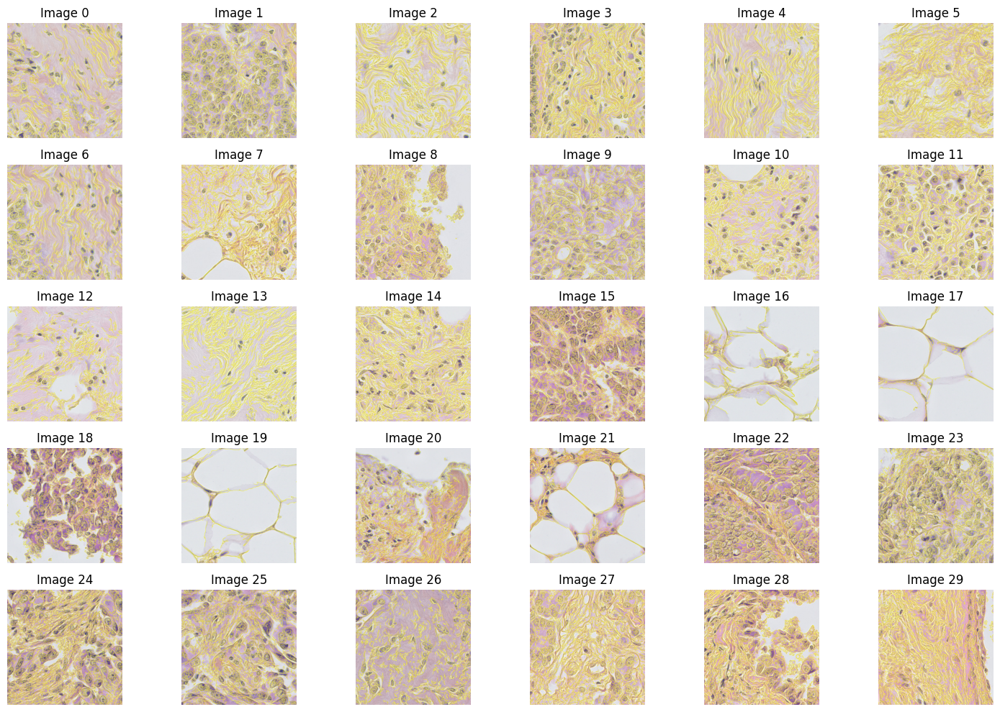

In [ ]:
import os
import numpy as np
from skimage import io, color, feature
import matplotlib.pyplot as plt

# Define directories
input_dir = '/content/drive/MyDrive/breast cancer cell/train folder/img'
output_dir = '/content/drive/MyDrive/breast cancer cell/train folder/canny'  # Updated output directory

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# List of filenames (or dynamically list them if not known in advance)
filenames = [f for f in os.listdir(input_dir) if f.endswith('.png')]
filenames.sort()  # Optional, sort filenames

# Process each image
for filename in filenames:
    img_path = os.path.join(input_dir, filename)
    output_path = os.path.join(output_dir, filename)

    if not os.path.exists(img_path):
        print(f"File does not exist: {img_path}")
        continue

    # Read the image
    A = io.imread(img_path)

    # Check if image has alpha channel and remove it
    if A.shape[-1] == 4:
        A = A[:,:,:3]  # Keep only first 3 channels (RGB)

    # Convert to grayscale and detect edges using Canny
    gray_img = color.rgb2gray(A)
    E = feature.canny(gray_img)

    # Create a copy of the original image
    B = A.copy()

    # Overlay the edges on the original image in yellow
    B[E] = [255, 255, 0]  # Yellow color

    # Save the modified image
    io.imsave(output_path, B)

    print(f"Processed and saved: {output_path}")

# Calculate the number of rows for subplots based on the number of images
num_rows = (len(filenames) + 5) // 6  # Calculate the number of rows needed

# Display images
fig, axs = plt.subplots(num_rows, 6, figsize=(15, 10))  # Adjust size and number of subplots based on the number of images

for i, filename in enumerate(filenames):
    img_path = os.path.join(output_dir, filename)

    if os.path.exists(img_path):
        B = io.imread(img_path)

        row = i // 6
        col = i % 6
        axs[row, col].imshow(B)
        axs[row, col].axis('off')
        axs[row, col].set_title(f'Image {i}')
    else:
        print(f"Image not found: {img_path}")

# Hide unused subplots if there are fewer images than subplots
for j in range(len(filenames), num_rows * 6):
    axs[j // 6, j % 6].axis('off')

plt.tight_layout()
plt.show()

Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/07_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/07_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/07_3.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/08_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/08_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/08_3.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/08_4.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/09_1.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/09_2.png
Processed and saved: /content/drive/MyDrive/breast cancer cell/validation folder/canny/09_3.png


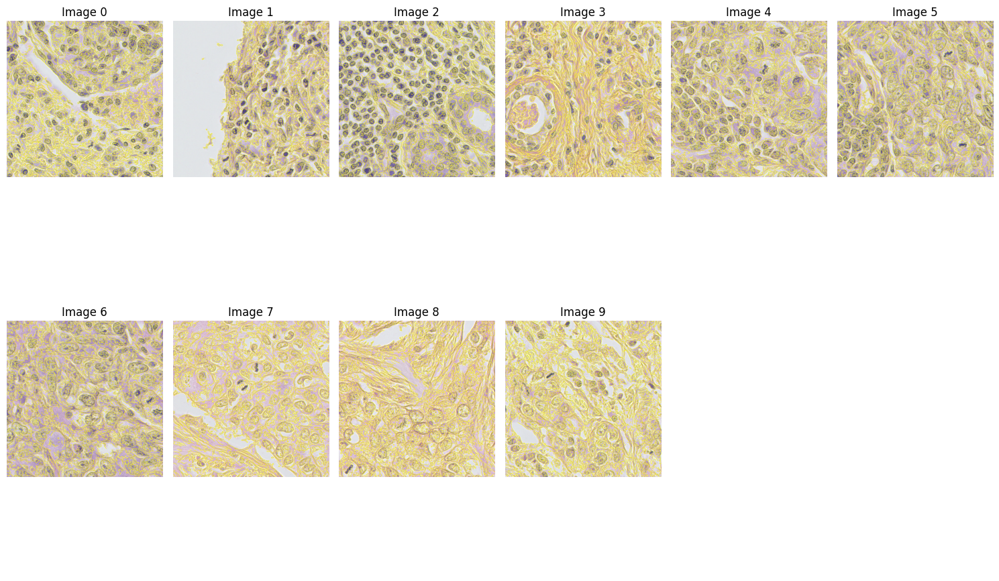

In [ ]:
import os
import numpy as np
from skimage import io, color, feature
import matplotlib.pyplot as plt

# Define directories
input_dir = '/content/drive/MyDrive/breast cancer cell/validation folder/img'
output_dir = '/content/drive/MyDrive/breast cancer cell/validation folder/canny'  # Updated output directory

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# List of filenames (or dynamically list them if not known in advance)
filenames = [f for f in os.listdir(input_dir) if f.endswith('.png')]
filenames.sort()  # Optional, sort filenames

# Process each image
for filename in filenames:
    img_path = os.path.join(input_dir, filename)
    output_path = os.path.join(output_dir, filename)

    if not os.path.exists(img_path):
        print(f"File does not exist: {img_path}")
        continue

    # Read the image
    A = io.imread(img_path)

    # Check if image has alpha channel and remove it
    if A.shape[-1] == 4:
        A = A[:,:,:3]  # Keep only first 3 channels (RGB)

    # Convert to grayscale and detect edges using Canny
    gray_img = color.rgb2gray(A)
    E = feature.canny(gray_img)

    # Create a copy of the original image
    B = A.copy()

    # Overlay the edges on the original image in yellow
    B[E] = [255, 255, 0]  # Yellow color

    # Save the modified image
    io.imsave(output_path, B)

    print(f"Processed and saved: {output_path}")

# Calculate the number of rows for subplots based on the number of images
num_rows = (len(filenames) + 5) // 6  # Calculate the number of rows needed

# Display images
fig, axs = plt.subplots(num_rows, 6, figsize=(15, 10))  # Adjust size and number of subplots based on the number of images

for i, filename in enumerate(filenames):
    img_path = os.path.join(output_dir, filename)

    if os.path.exists(img_path):
        B = io.imread(img_path)

        row = i // 6
        col = i % 6
        axs[row, col].imshow(B)
        axs[row, col].axis('off')
        axs[row, col].set_title(f'Image {i}')
    else:
        print(f"Image not found: {img_path}")

# Hide unused subplots if there are fewer images than subplots
for j in range(len(filenames), num_rows * 6):
    axs[j // 6, j % 6].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Define the source and destination folder pairs
folders = [
     {
        "source": '/content/drive/MyDrive/breast cancer cell/validation folder/canny/',  # Replace with the first source folder path
        "destination": '/content/drive/MyDrive/breast cancer cell/validation folder/canny_masks/'  # Replace with the first destination folder path
    },

    {
        "source": '/content/drive/MyDrive/breast cancer cell/train folder/canny/',  # Replace with the second source folder path
        "destination": '/content/drive/MyDrive/breast cancer cell/train folder/canny_masks/'  # Replace with the second destination folder path
    },
    {
        "source": '/content/drive/MyDrive/breast cancer cell/test folder/canny/',  # Replace with the third source folder path
        "destination": '/content/drive/MyDrive/breast cancer cell/test folder/canny_masks/'  # Replace with the third destination folder path
    }
]

# Iterate over each folder pair
for folder in folders:
    source_folder = folder["source"]
    destination_folder = folder["destination"]

    # Create the destination folder if it does not exist
    os.makedirs(destination_folder, exist_ok=True)

    # Loop through all files in the source folder
    for filename in os.listdir(source_folder):
        # Construct full file path
        file_path = os.path.join(source_folder, filename)

        # Check if the file is an image (optional: filter specific formats)
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')):
            # Load the image in grayscale
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

            # Check if the image is loaded correctly
            if image is None:
                print(f"Error: Unable to load image {filename} from {source_folder}. Skipping.")
                continue

            # Apply inverse binary threshold to create a binary mask
            _, binary_mask = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)

            # Create the ground truth mask (same as binary mask in this example)
            ground_truth_mask = binary_mask.copy()

            # Save the ground truth mask to the destination folder
            mask_save_path = os.path.join(destination_folder, filename)  # Save with the same filename
            cv2.imwrite(mask_save_path, ground_truth_mask)

            print(f"Processed and saved ground truth mask for {filename} in {destination_folder}")

            # Optional: Display the original image and the mask
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 3, 1)
            plt.imshow(image, cmap='gray')
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(binary_mask, cmap='gray')
            plt.title('Binary Mask')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(ground_truth_mask, cmap='gray')
            plt.title('Ground Truth Mask')
            plt.axis('off')

            plt.tight_layout()
            plt.show()

print("All images from all folders processed and ground truth masks saved.")


In [ ]:
c_train_img_path = '../content/drive/MyDrive/breast cancer cell/train folder/img'
c_train_mask_path = '../content/drive/MyDrive/breast cancer cell/train folder/canny_masks'
c_val_img_path = '../content/drive/MyDrive/breast cancer cell/validation folder/img'
c_val_mask_path = '../content/drive/MyDrive/breast cancer cell/validation folder/canny_masks'


In [ ]:
import os
# Load images and masks
c_train_images = sorted([os.path.join(c_train_img_path, f) for f in os.listdir(c_train_img_path) if f.endswith('.png')])
c_train_masks = sorted([os.path.join(c_train_mask_path, f) for f in os.listdir(c_train_mask_path) if f.endswith('.png')])
c_val_images = sorted([os.path.join(c_val_img_path, f) for f in os.listdir(c_val_img_path) if f.endswith('.png')])
c_val_masks = sorted([os.path.join(c_val_mask_path, f) for f in os.listdir(c_val_mask_path) if f.endswith('.png')])


In [ ]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
IMG_CHANNELS = 1

In [ ]:
def load_and_resize(images, masks):
    X = np.zeros((len(images), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
    y = np.zeros((len(masks), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool_)
    for n, img_path in enumerate(images):
        # Read image using imread from scikit-image
        img = imread(img_path, as_gray=True)
        # Resize image using resize from scikit-image
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        X[n] = np.expand_dims(img, axis=-1)

    for n, mask_path in enumerate(masks):
        # Read mask using imread from scikit-image
        mask = imread(mask_path, as_gray=True)
        # Resize mask using resize from scikit-image
        mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        y[n] = np.expand_dims(mask, axis=-1)

    return X, y

In [ ]:
# Load and resize images and masks
X_train, y_train = load_and_resize(c_train_images, c_train_masks)
X_val, y_val = load_and_resize(c_val_images, c_val_masks)


In [ ]:
# Data augmentation parameters
data_gen_args = dict(rotation_range=20,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     shear_range=0.1,
                     zoom_range=0.2,
                     horizontal_flip=True,
                     fill_mode='nearest')

# ImageDataGenerators for augmentation
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)


In [ ]:
# Combine generators
seed = 42
# Use image_datagen and mask_datagen (defined in cell 50), instead of the undefined c_image_datagen and c_mask_datagen
c_train_image_generator = image_datagen.flow(X_train, batch_size=16, seed=seed)
c_train_mask_generator = mask_datagen.flow(y_train, batch_size=16, seed=seed)
c_train_generator = zip(c_train_image_generator, c_train_mask_generator)

In [ ]:
import tensorflow as tf

# Define U-Net Model with Regularization Layers and Reduced Complexity
# Define U-Net Model with Regularization Layers, Reduced Complexity, and Adjustable Dropout Rate
def unet_model(input_size=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout_rate=0.25):
    inputs = tf.keras.layers.Input(input_size)

    # Encoder (Reduced filter sizes)
    c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = tf.keras.layers.BatchNormalization()(c1)
    c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c1)
    c1 = tf.keras.layers.BatchNormalization()(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)
    p1 = tf.keras.layers.Dropout(dropout_rate)(p1)

    c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = tf.keras.layers.BatchNormalization()(c2)
    c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c2)
    c2 = tf.keras.layers.BatchNormalization()(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
    p2 = tf.keras.layers.Dropout(dropout_rate)(p2)

    c3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    c3 = tf.keras.layers.BatchNormalization()(c3)
    c3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c3)
    c3 = tf.keras.layers.BatchNormalization()(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
    p3 = tf.keras.layers.Dropout(dropout_rate)(p3)

    # Bottleneck
    c4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    c4 = tf.keras.layers.BatchNormalization()(c4)
    c4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001))(c4)
    c4 = tf.keras.layers.BatchNormalization()(c4)
    c4 = tf.keras.layers.Dropout(dropout_rate)(c4)

    # Decoder
    u1 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = tf.keras.layers.concatenate([u1, c3])
    c5 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u1)
    c5 = tf.keras.layers.BatchNormalization()(c5)
    c5 = tf.keras.layers.Dropout(dropout_rate)(c5)

    u2 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u2 = tf.keras.layers.concatenate([u2, c2])
    c6 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u2)
    c6 = tf.keras.layers.BatchNormalization()(c6)
    c6 = tf.keras.layers.Dropout(dropout_rate)(c6)

    u3 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
    u3 = tf.keras.layers.concatenate([u3, c1])
    c7 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u3)
    c7 = tf.keras.layers.BatchNormalization()(c7)
    c7 = tf.keras.layers.Dropout(dropout_rate)(c7)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)

    model = tf.keras.models.Model(inputs=[inputs], outputs=[outputs])
    return model

# Instantiate the model
model = unet_model()
model.summary()


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_96 (Conv2D)        │ (None, 128, 128, 32)   │            320 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_22    │ (None, 128, 128, 32)   │            128 │ conv2d_96[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_97 (Conv2D)        │ (None, 128, 128, 32)   │          9,248 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_23    │ (None, 128, 128, 32)   │            128 │ conv2d_97[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_18          │ (None, 64, 64, 32)     │              0 │ batch_normalization_2… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_20 (Dropout)      │ (None, 64, 64, 32)     │              0 │ max_pooling2d_18[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_98 (Conv2D)        │ (None, 64, 64, 64)     │         18,496 │ dropout_20[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_24    │ (None, 64, 64, 64)     │            256 │ conv2d_98[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_99 (Conv2D)        │ (None, 64, 64, 64)     │         36,928 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_25    │ (None, 64, 64, 64)     │            256 │ conv2d_99[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_19          │ (None, 32, 32, 64)     │              0 │ batch_normalization_2… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_21 (Dropout)      │ (None, 32, 32, 64)     │              0 │ max_pooling2d_19[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_100 (Conv2D)       │ (None, 32, 32, 128)    │         73,856 │ dropout_21[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_26    │ (None, 32, 32, 128)    │            512 │ conv2d_100[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_101 (Conv2D)  

 Total params: 1,736,001 (6.62 MB)

 Trainable params: 1,733,633 (6.61 MB)

 Non-trainable params: 2,368 (9.25 KB)

In [ ]:
from tensorflow.keras.metrics import BinaryAccuracy, Precision, Recall

# Instantiate Precision and Recall outside the function
precision = Precision()
recall = Recall()

def f1_score(y_true, y_pred):
    # Adjust threshold for metric calculation
    y_pred = tf.cast(y_pred > 0.3, tf.float32)  # Adjust threshold if needed
    # Use the pre-instantiated objects
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * (p * r) / (p + r + tf.keras.backend.epsilon())

In [ ]:
# Compile the model
m_c = unet_model()
m_c.compile(optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
              loss='binary_crossentropy',
              metrics=[MeanIoU(num_classes=2), 'accuracy',f1_score])

In [ ]:
# Callbacks
checkpoint = ModelCheckpoint('unet_model_canny.keras', monitor='loss', save_best_only=True)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-6)

In [ ]:
import tensorflow as tf
import datetime # Import datetime for TensorBoard log directory naming

# Assuming image_datagen and mask_datagen are defined in a previous cell (e.g., cell 50)

def c_train_generator_fn():
    seed = 42
    # Use image_datagen and mask_datagen instead of the undefined c_image_datagen and c_mask_datagen
    c_train_image_generator = image_datagen.flow(X_train, batch_size=16, seed=seed)
    c_train_mask_generator = mask_datagen.flow(y_train, batch_size=16, seed=seed)
    for img, mask in zip(c_train_image_generator, c_train_mask_generator):
        yield img, mask

# Define the output signature to match your model's input
output_signature = (
    tf.TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32),
    tf.TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32)
)

dataset = tf.data.Dataset.from_generator(
    c_train_generator_fn,
    output_signature=output_signature
)

# Train the model
history = m_c.fit(c_train_generator_fn(),
                    steps_per_epoch=len(X_train) // 16,
                    validation_data=(X_val, y_val),
                    epochs=50,
                    callbacks=[checkpoint, early_stopping, reduce_lr, tensorboard_callback])

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.7363 - f1_score: 0.4173 - loss: 1.1732 - mean_io_u_2: 0.4152 - val_accuracy: 0.6843 - val_f1_score: 0.4420 - val_loss: 1.1403 - val_mean_io_u_2: 0.3421 - learning_rate: 0.0010
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step - accuracy: 0.7722 - f1_score: 0.4179 - loss: 1.1392 - mean_io_u_2: 0.4270 - val_accuracy: 0.6843 - val_f1_score: 0.4307 - val_loss: 1.1089 - val_mean_io_u_2: 0.3421 - learning_rate: 0.0010
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.7640 - f1_score: 0.4191 - loss: 1.1069 - mean_io_u_2: 0.4257 - val_accuracy: 0.6843 - val_f1_score: 0.4274 - val_loss: 1.0790 - val_mean_io_u_2: 0.3421 - learning_rate: 0.0010
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.7469 - f1_score: 0.4238 - loss: 1.0764 - mean_io_u_2: 0.4184 - val_accuracy: 0.6843 - val_f1_score: 0.4296 - val_loss: 1.0507 - val_mean_io_u_2: 0.3421 - learning_rate: 0.0010
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step -

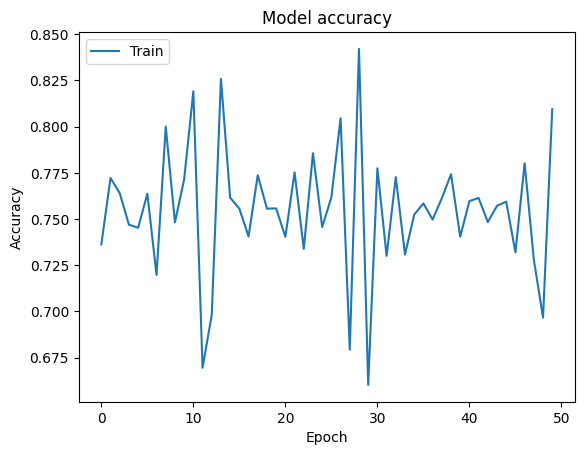

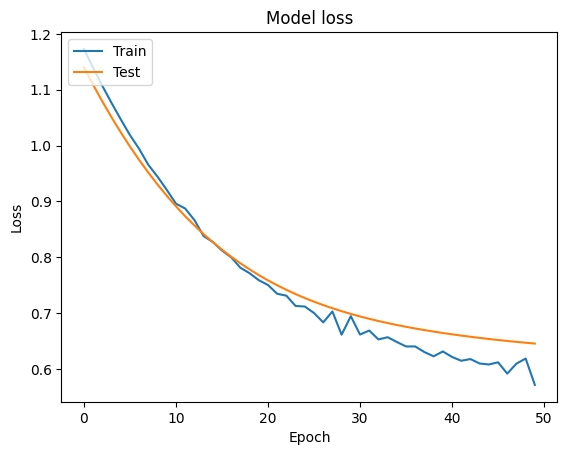

In [ ]:
plt.plot(history.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
final_accuracy = history.history['accuracy'][-1]
print(f"Final Training Accuracy: {final_accuracy:.4f}")

if 'val_accuracy' in history.history:
    final_val_accuracy = history.history['val_accuracy'][-1]
    print(f"Final Validation Accuracy: {final_val_accuracy:.4f}")


Final Training Accuracy: 0.8094
Final Validation Accuracy: 0.6843


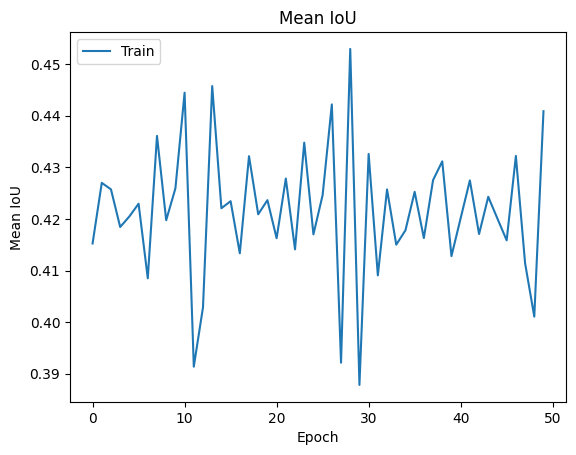

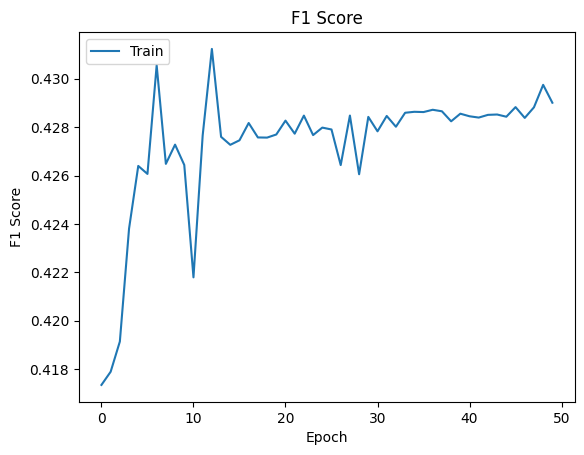

In [ ]:
# Plot MeanIoU if tracked in history
if 'mean_io_u_2' in history.history:  # Replace 'mean_io_u' with the exact key in your history object
    plt.plot(history.history['mean_io_u_2'])
    plt.title('Mean IoU')
    plt.ylabel('Mean IoU')
    plt.xlabel('Epoch')
    plt.legend(['Train'], loc='upper left')
    plt.show()

# Plot F1 Score if tracked in history
if 'f1_score' in history.history:  # Replace 'f1_score' with the exact key in your history object
    plt.plot(history.history['f1_score'])
    plt.title('F1 Score')
    plt.ylabel('F1 Score')
    plt.xlabel('Epoch')
    plt.legend(['Train'], loc='upper left')
    plt.show()


In [ ]:
# Get the final training Mean IoU, if tracked
if 'mean_io_u_2' in history.history:  # Replace 'mean_io_u' with the correct key
    final_training_mean_iou = history.history['mean_io_u_2'][-1]
    print(f"Final Training Mean IoU: {final_training_mean_iou:.4f}")


# Get the final training F1 Score, if tracked
if 'f1_score' in history.history:  # Replace 'f1_score' with the correct key
    final_training_f1_score = history.history['f1_score'][-1]
    print(f"Final Training F1 Score: {final_training_f1_score:.4f}")




Final Training Mean IoU: 0.4409
Final Training F1 Score: 0.4290


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def activation_map(image, layer_index, channel, model):
    """Displays:
        1. Original test image
        2. Activation Map for the provided layer and channel
        3. Transparent overlay of Activation Map over test image

    Args:
        image (str): Location of the test image
        layer_index (int): Layer index, as found from model summary
        channel (int): Channel number in the layer
        model (tf.keras.Model): Keras Model object used as network

    Returns:
        None
    """

    # Define specification of our plot
    fig, axs = plt.subplots(1, 3, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(wspace=0.2)
    axs = axs.ravel()

    # Display Original test image
    ori = cv2.imread(image)

    # Check if the image was loaded correctly
    if ori is None:
        print(f"Error: Could not load image {image}")
        return

    axs[0].set_title('Original Image')
    axs[0].imshow(cv2.cvtColor(ori, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying

    # Prepare image for model input
    img = cv2.imread(image, cv2.IMREAD_GRAYSCALE)  # Reading image as grayscale
    x = cv2.resize(img, (128, 128), interpolation=cv2.INTER_AREA)
    x = np.expand_dims(x, axis=-1)  # Add channel dimension
    x = np.expand_dims(x, axis=0)  # Add batch dimension
    x = x / 255.0  # Normalize

    # Get layer output
    layer_output_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[layer_index].output)
    layer_output = layer_output_model.predict(x)

    act = layer_output[0, :, :, channel]  # Visualizing 'channel' of 'layer'
    act = cv2.resize(act, (128, 128))  # Resize to original image size
    act = (act - np.min(act)) / (np.max(act) - np.min(act))  # Normalize to [0, 1]

    axs[1].set_title('Activation Map')
    axs[1].imshow(act, cmap='jet')

    # Display Activation Map overlayed on test image
    img = img.astype('float32') / 255.0
    img = cv2.resize(img, (128, 128))  # Resize to match activation map
    dst = cv2.addWeighted(img, 0.5, act, 0.5, 0)  # Overlay activation map
    axs[2].set_title('Overlayed')
    axs[2].imshow(dst, cmap='jet')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


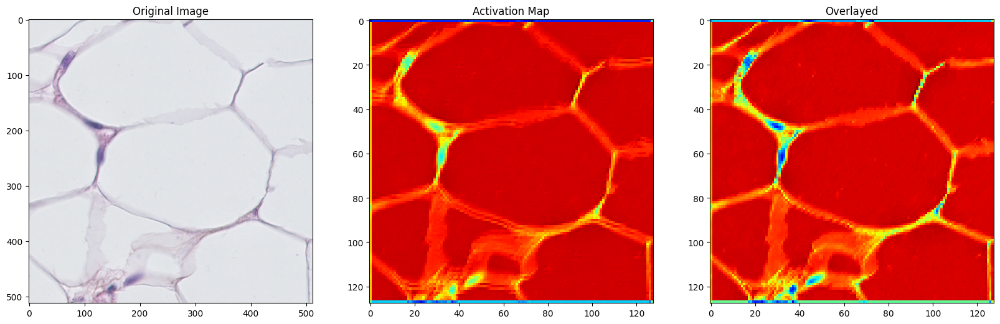

In [ ]:
# Path to your test image
image_path = '/content/04_5.png'

# Layer index (based on the layer's position in the model)
layer_index = 1  # Changed this to a smaller number to prevent the error

# Channel index to visualize
channel = 0

# Call the function
activation_map(image_path, layer_index, channel, m_c)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


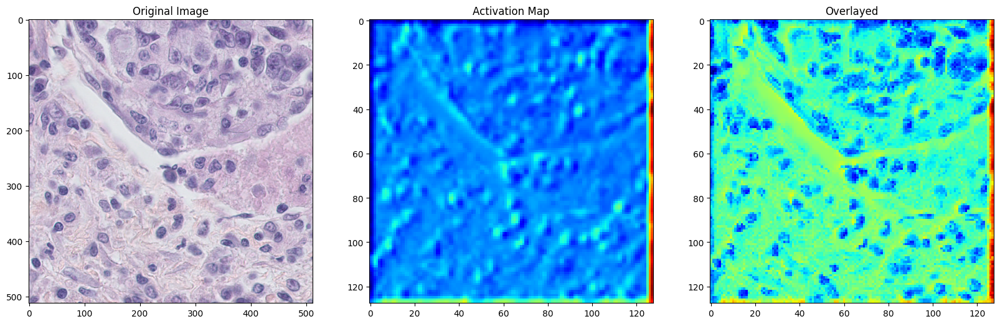

In [ ]:
# Path to your test image
image_path = '/content/07_1.png'

# Layer index (based on the layer's position in the model)
layer_index = 3  # Changed this to a smaller number to prevent the error

# Channel index to visualize
channel = 0

# Call the function
activation_map(image_path, layer_index, channel, m_c)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


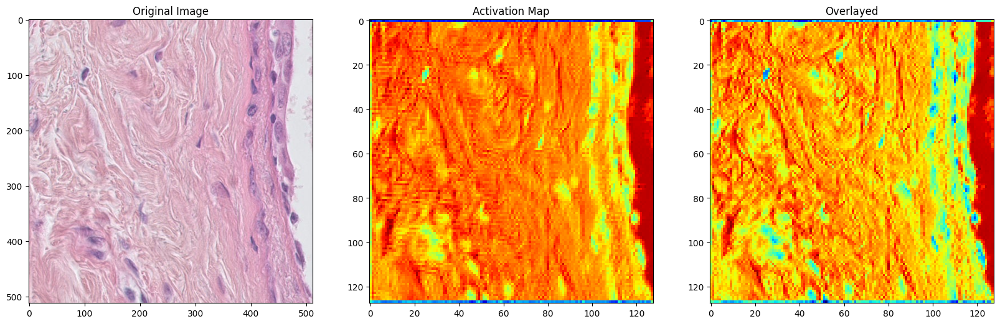

In [ ]:
# Path to your test image
image_path = '/content/06_3.png'

# Layer index (based on the layer's position in the model)
layer_index = 1  # Changed this to a smaller number to prevent the error

# Channel index to visualize
channel = 0

# Call the function
activation_map(image_path, layer_index, channel, m_c)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


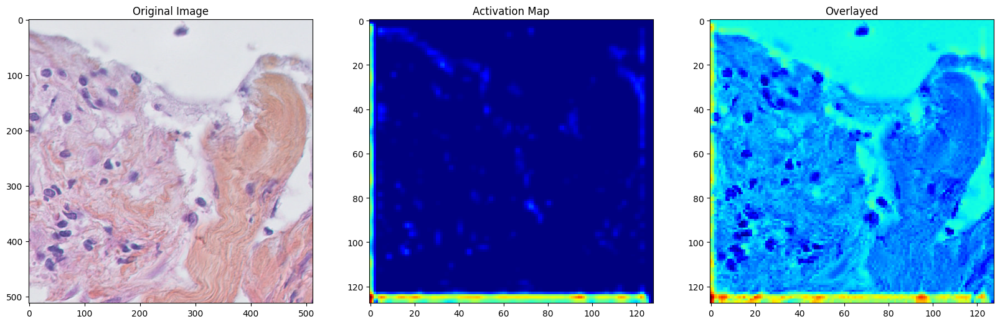

In [ ]:
# Path to your test image
image_path = '/content/04_6.png'

# Layer index (based on the layer's position in the model)
layer_index = 5  # Changed this to a smaller number to prevent the error

# Channel index to visualize
channel = 1

# Call the function
activation_map(image_path, layer_index, channel, m_c)


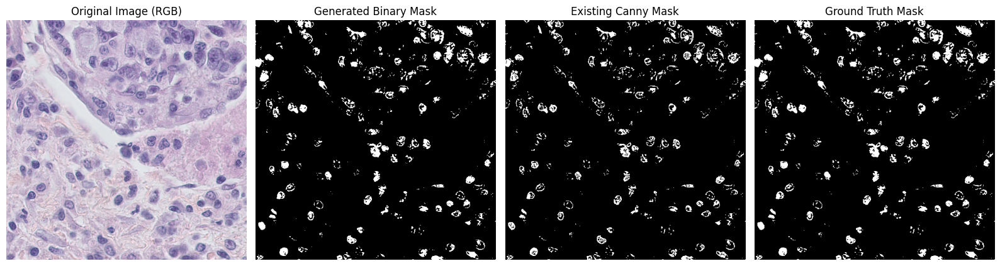

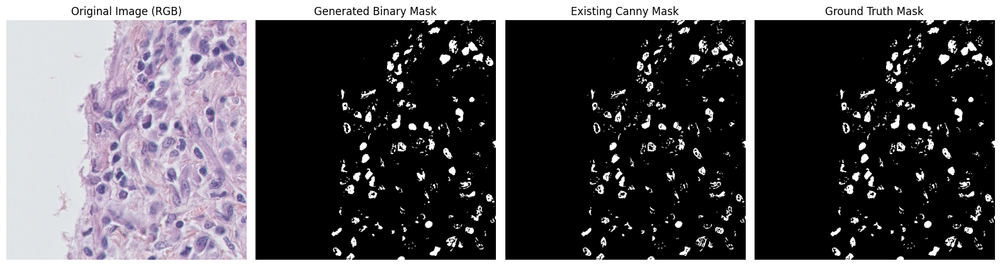

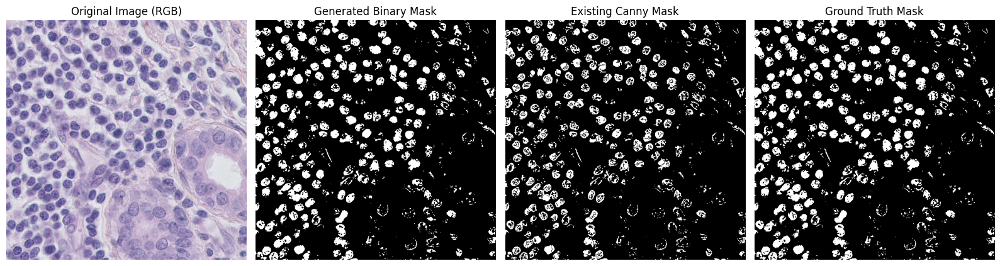

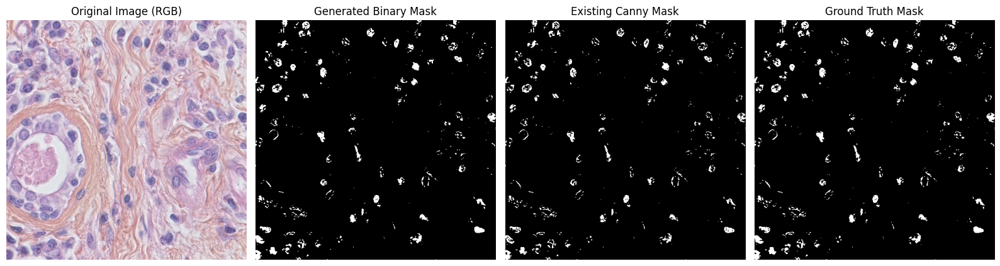

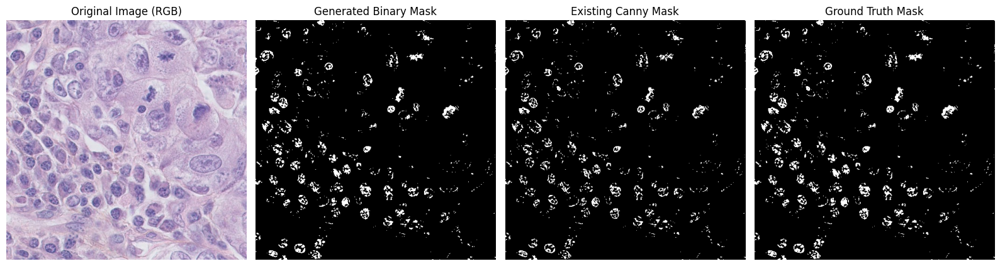

Displayed comparison for 5 images.


In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Define the source folders and corresponding mask folders
folders = [
    {
        "source": '/content/drive/MyDrive/breast cancer cell/validation folder/img/',  # First source folder path
        "canny_mask": '/content/drive/MyDrive/breast cancer cell/validation folder/canny_masks/',  # Corresponding canny mask folder
        "gt_mask": '/content/drive/MyDrive/breast cancer cell/validation folder/masks/'  # Additional mask folder
    },
    {
        "source": '/content/drive/MyDrive/breast cancer cell/train folder/img/',  # Second source folder path
        "canny_mask": '/content/drive/MyDrive/breast cancer cell/train folder/canny_masks/',  # Corresponding canny mask folder
        "gt_mask": '/content/drive/MyDrive/breast cancer cell/train folder/masks/'  # Additional mask folder
    },
    {
        "source": '/content/drive/MyDrive/breast cancer cell/test folder/img/',  # Third source folder path
        "canny_mask": '/content/drive/MyDrive/breast cancer cell/test folder/canny_masks/',  # Corresponding canny mask folder
        "gt_mask": '/content/drive/MyDrive/breast cancer cell/test folder/masks/'  # Additional mask folder
    }
]

# Number of images to display for comparison
num_images_to_display = 5
displayed_images = 0

# Iterate over each folder
for folder in folders:
    source_folder = folder["source"]
    canny_mask_folder = folder["canny_mask"]
    gt_mask_folder = folder["gt_mask"]

    # Loop through all files in the source folder
    for filename in os.listdir(source_folder):
        if displayed_images >= num_images_to_display:
            break

        # Construct full file paths
        file_path = os.path.join(source_folder, filename)
        canny_mask_path = os.path.join(canny_mask_folder, filename)
        gt_mask_path = os.path.join(gt_mask_folder, filename)

        # Check if the file is an image (optional: filter specific formats)
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')):
            # Load the original image in color (BGR)
            image = cv2.imread(file_path)

            # Convert the image from BGR to RGB for displaying with matplotlib
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Load the corresponding canny mask and ground truth mask
            canny_mask = cv2.imread(canny_mask_path, cv2.IMREAD_GRAYSCALE)
            gt_mask = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)

            # Check if the image, canny mask, and ground truth mask are loaded correctly
            if image is None or canny_mask is None or gt_mask is None:
                print(f"Error: Unable to load image or masks for {filename}. Skipping.")
                continue

            # Apply inverse binary threshold to create a binary mask
            _, binary_mask = cv2.threshold(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY_INV)

            # Compare the original image, generated mask, canny mask, and ground truth mask
            plt.figure(figsize=(16, 8))

            # Display the original image in RGB
            plt.subplot(1, 4, 1)
            plt.imshow(image_rgb)
            plt.title('Original Image (RGB)')
            plt.axis('off')

            # Display the generated binary mask
            plt.subplot(1, 4, 2)
            plt.imshow(binary_mask, cmap='gray')
            plt.title('Generated Binary Mask')
            plt.axis('off')

            # Display the existing canny mask
            plt.subplot(1, 4, 3)
            plt.imshow(canny_mask, cmap='gray')
            plt.title('Existing Canny Mask')
            plt.axis('off')

            # Display the ground truth mask from the additional folder
            plt.subplot(1, 4, 4)
            plt.imshow(gt_mask, cmap='gray')
            plt.title('Ground Truth Mask')
            plt.axis('off')

            # Adjust the layout for better spacing
            plt.tight_layout()
            plt.show()

            displayed_images += 1

    if displayed_images >= num_images_to_display:
        break

print(f"Displayed comparison for {num_images_to_display} images.")
